## Exercise 1

Consider the first two classes of the Cork Stoppers.xls data set. <p>

### (a) Consider the features ART and PRT. Fit a Bayes classifier, compute the decision boundary and the error.

In [3]:
import scipy.io as sio
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
from sklearn import mixture
from scipy.stats import multivariate_normal

In [4]:
#Fit bayes for the training data
def fitBayes(Xtr,ytr):
    ix1=np.where(ytr==1)[0]
    ix2=np.where(ytr==2)[0]
    
    #Compute priors
    Pw1=ix1.shape[0]/(ix1.shape[0]+ix2.shape[0])
    Pw2=ix2.shape[0]/(ix1.shape[0]+ix2.shape[0])
    
    # Estimate gaussian conditional PDFs --> fit two Gaussian Mixture Models
    clf1 = mixture.GaussianMixture(n_components=1)
    clf2 = mixture.GaussianMixture(n_components=1)
    mod1=clf1.fit(Xtr[ix1,:])
    mod2=clf2.fit(Xtr[ix2,:])
    
    return {'mean1':mod1.means_.squeeze(),'mean2':mod2.means_.squeeze(),
            'cov1':mod1.covariances_[0],'cov2':mod2.covariances_[0],
            'Pw1':Pw1,'Pw2':Pw2}

In [5]:
#Function to evaluate a gaussian PDF acourding to 
def pdfGauss(X,mean,cov):
    covInv=np.linalg.inv(cov)
    dim=cov.shape[0]
    val=np.array([])
    for i in range(X.shape[0]):
        dist=((np.array([X[i,:]-mean]))@covInv@(np.array([X[i,:]-mean])).T).squeeze()
        multivariate_pdf = np.exp(-0.5*dist)/((2*np.pi)**(dim/2)*np.linalg.det(cov)**0.5)
        val=np.append(val, multivariate_pdf)
    return np.array([val]).T

In [6]:
#Apply a trained bayes classifier
def useBayes(Xte,model):
    Pw1X = pdfGauss(Xte,model['mean1'],model['cov1'])*model['Pw1']
    Pw2X = pdfGauss(Xte,model['mean2'],model['cov2'])*model['Pw2']
    
    return ((-np.sign(Pw1X-Pw2X))*0.5+1.5).squeeze() #1-W1, 2-W2
    # Adicionado o sinal negativo para ter em conta a approach original do toolbox em matlab

In [15]:
def plotDecision(X,y,model,granularity=0.01,classContours=False,f1name="f1",f2name="f2"):
    #Identify class indexes
    ix1=np.where(y==1)[0]
    ix2=np.where(y==2)[0]
    
    #Create vectors for plotting
    xRange=np.arange(X[:,0].min(),X[:,0].max()+0.5,granularity)
    yRange=np.arange(X[:,1].min(),X[:,1].max(),granularity)
    
    Xp, Yp = np.meshgrid(xRange, yRange)
    xy = np.column_stack([Xp.flat, Yp.flat])
    XX = np.array([Xp.ravel(), Yp.ravel()]).T
    #Sample class one pdf, just to get contours
    Z1 = pdfGauss(XX,model['mean1'],model['cov1'])
    Z1 = Z1.reshape(Xp.shape)
    #Sample class two pdf, just to get contours
    Z2=pdfGauss(XX,model['mean2'],model['cov2'])
    Z2 = Z2.reshape(Xp.shape)
    
    #Plot samples
    fig=go.Figure()
    fig.add_trace(go.Scatter(x=X[ix1,0],y=X[ix1,1],name='1'))
    fig.add_trace(go.Scatter(x=X[ix2,0],y=X[ix2,1],name='2'))
    fig.update_traces(marker=dict(size=8))
    #Plot means
    fig.add_trace(go.Scatter(x=np.array(model['mean1'][0]),y=np.array(model['mean1'][1]), marker_size=20,
                         marker_symbol='x',name='1 mean',
                         marker=dict(color="blue",line=dict(width=1,
                                        color='black'))))
    fig.add_trace(go.Scatter(x=np.array(model['mean2'][0]),y=np.array(model['mean2'][1]), marker_size=20,
                         marker_symbol='x',name='2 mean',
                         marker=dict(color="red",line=dict(width=1,
                                        color='black'))))
    fig.update_traces(mode='markers')
    
    
    #Compute Bayes decision for the grid created by xRange and yRange
    yteP=np.zeros((yRange.shape[0],xRange.shape[0]))
    for i in range(xRange.shape[0]):
        for j in range(yRange.shape[0]):
            yteP[j,i]=useBayes(np.array([[xRange[i],yRange[j]]]),model)
    
    if classContours:
        #Add class 1 contours
        fig.add_trace(go.Contour(
            z=Z1,x=xRange,y=yRange,
            contours_coloring='lines',
            line_width=1,showscale=False,))
    
        #Add class 2 contours
        fig.add_trace(go.Contour(
            z=Z2,x=xRange,y=yRange,
            contours_coloring='lines',
            line_width=1,showscale=False,))
        
    
    #Add decision contour
    fig.add_trace(go.Contour(
        z=yteP,x=xRange,y=yRange,contours_coloring='lines',name='Decision Boundary',colorscale='Greys',
        line_width=4,showscale=False))
    fig.update_traces(ncontours=100, selector=dict(type='contour'))
    fig.update_xaxes(title_text=f1name)
    fig.update_yaxes(title_text=f2name)
    fig.update_layout(autosize=False,width=900,height=800)
    fig.show()

Sensitivity(%)=92.0
Specificity(%)=84.0
Precision(%)=85.18518518518519
F1Score(%)=88.46153846153845
Accuracy(%)=88.0


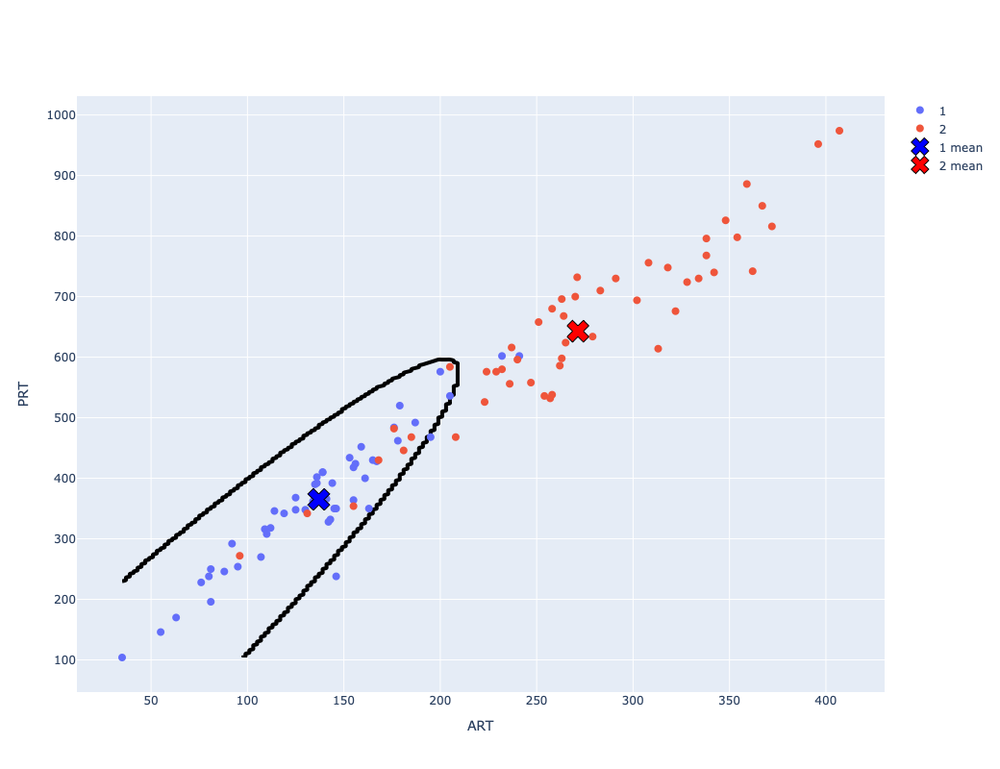

In [17]:
import plotly.graph_objects as go
import numpy as np
import pandas as pd

####################################################################################################
####################################################################################################
xlsFile=pd.read_excel("/Users/cesarteixeira/Documents/AulasRepo/ML/Datasets/CORK_STOPPERS.XLS",
                      sheet_name="Data",
                      usecols=["C","ART","N.1","PRT","ARM","PRM","ARTG","NG","PRTG","RAAR","RAN"])
CorkStopp=pd.DataFrame(data=xlsFile.dropna())

fnames=CorkStopp.columns[1:]

ixSuper=np.where(CorkStopp['C']==1)
ixAverage=np.where(CorkStopp['C']==2)
ixPoor=np.where(CorkStopp['C']==3)

ARTSup=CorkStopp['ART'].to_numpy()[ixSuper]
ARTAvg=CorkStopp['ART'].to_numpy()[ixAverage]

PRTSup=(CorkStopp['PRT'].to_numpy())[ixSuper]
PRTAvg=(CorkStopp['PRT'].to_numpy())[ixAverage]

X1=np.array([ARTSup,PRTSup]).T
X2=np.array([ARTAvg,PRTAvg]).T
XtrC=np.concatenate((X1,X2),axis=0)
ytrC=np.concatenate((CorkStopp['C'].to_numpy()[ixSuper],CorkStopp['C'].to_numpy()[ixAverage]))

####################################################################################################
####################################################################################################
#Fit bayes to training
modelC=fitBayes(XtrC,ytrC)
#Evaluate in testing
yp=useBayes(XtrC,modelC)

####################################################################################################
####################################################################################################
TP=np.shape(np.where((ytrC[ixSuper]==yp[ixSuper]))[0])[0]
TN=np.shape(np.where((ytrC[ixAverage]==yp[ixAverage]))[0])[0]
FP=np.shape(np.where((ytrC[ixAverage]!=yp[ixAverage]))[0])[0]
FN=np.shape(np.where((ytrC[ixSuper]!=yp[ixSuper]))[0])[0]

SS=TP/(TP+FN)
SP=TN/(TN+FP)
PR=TP/(TP+FP)
F1=2*PR*SS/(PR+SS)
AC=(TN+TP)/(TP+TN+FP+FN)

print("Sensitivity(%)="+str(SS*100))
print("Specificity(%)="+str(SP*100))
print("Precision(%)="+str(PR*100))
print("F1Score(%)="+str(F1*100))
print("Accuracy(%)="+str(AC*100))

####################################################################################################
####################################################################################################
plotDecision(XtrC,ytrC,modelC,granularity=2,f1name="ART",f2name="PRT")

####################################################################################################
####################################################################################################
#Plot conditional PDFs as 3D surfaces

#Create vectors for plotting
xp=np.arange(30,500,5)
yp=np.arange(100,1000,5)
Xp, Yp = np.meshgrid(xp, yp)
xy = np.column_stack([Xp.flat, Yp.flat])
XX = np.array([Xp.ravel(), Yp.ravel()]).T
#Sample class 1 PDF
Z1 = pdfGauss(XX,modelC['mean1'],modelC['cov1'])
Z1 = Z1.reshape(Xp.shape)

#Sample class 2 PDF
Z2=pdfGauss(XX,modelC['mean2'],modelC['cov2'])
Z2 = Z2.reshape(Xp.shape)


fig=go.Figure()

fig.add_trace(go.Surface(x=Xp,y=Yp,z=Z1))
fig.add_trace(go.Surface(x=Xp,y=Yp,z=Z2))
fig.update_traces(contours_z=dict(show=True, usecolormap=True,
                                  highlightcolor="limegreen", project_z=True))
fig.update_scenes(xaxis_title_text='ART',  
                  yaxis_title_text='PRT',  
                  zaxis_title_text='PDF')

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000)


fig.show()

### (b) Consider the three most discriminative features. Compute the Bayes error for two and three classes.

Acourding to Kruskal-Wallis:

ART-->121.58964258474009
PRM-->117.63782046335828
PRT-->115.74851860346449

In [23]:
#Fit bayes for the training data

def pdfGauss(X,mean,cov):
    covInv=np.linalg.inv(cov)
    dim=cov.shape[0]
    val=np.array([])
    for i in range(X.shape[0]):
        dist=((np.array([X[i,:]-mean]))@covInv@(np.array([X[i,:]-mean])).T).squeeze()
        val=np.append(val,np.exp(-0.5*dist)/((2*np.pi)**(dim/2)*np.linalg.det(cov)**0.5))
    return np.array([val]).T


def fitBayes3k(Xtr,ytr):
    ix1=np.where(ytr==1)[0]
    ix2=np.where(ytr==2)[0]
    ix3=np.where(ytr==3)[0]
    
    #Compute priors
    Pw1=ix1.shape[0]/(ix1.shape[0]+ix2.shape[0]+ix3.shape[0])
    Pw2=ix2.shape[0]/(ix1.shape[0]+ix2.shape[0]+ix3.shape[0])
    Pw3=ix3.shape[0]/(ix1.shape[0]+ix2.shape[0]+ix3.shape[0])
    
    # Estimate gaussian conditional PDFs --> fit three Gaussian Mixture Models
    clf1 = mixture.GaussianMixture(n_components=1)
    clf2 = mixture.GaussianMixture(n_components=1)
    clf3 = mixture.GaussianMixture(n_components=1)
    mod1=clf1.fit(Xtr[ix1,:])
    mod2=clf2.fit(Xtr[ix2,:])
    mod3=clf3.fit(Xtr[ix3,:])
    
    return {'mean1':mod1.means_.squeeze(),'mean2':mod2.means_.squeeze(),'mean3':mod3.means_.squeeze(),'cov1':mod1.covariances_[0],
            'cov2':mod2.covariances_[0],'cov3':mod3.covariances_[0],'Pw1':Pw1,'Pw2':Pw2,'Pw3':Pw3}

#Apply a trained bayes classifier
def useBayes3(Xte,model):
    Pw1X = pdfGauss(Xte,model['mean1'],model['cov1'])*model['Pw1']
    Pw2X = pdfGauss(Xte,model['mean2'],model['cov2'])*model['Pw2']
    Pw3X = pdfGauss(Xte,model['mean3'],model['cov3'])*model['Pw3']
    
    PwXX=np.concatenate((Pw1X,Pw2X,Pw3X),axis=1)
    
    res=np.array([])
    for i in range(PwXX.shape[0]):
        res=np.append(res,np.where(PwXX[i,:]==np.max(PwXX[i,:]))[0]+1)
    
    return res


#Features
ART=np.array([CorkStopp['ART'].to_numpy()])

PRM=np.array([CorkStopp['PRM'].to_numpy()])

PRT=np.array([CorkStopp['PRT'].to_numpy()])


#Training Set
XtrC2=np.concatenate((ART,PRM,PRT),axis=0).T
ytrC2=CorkStopp['C'].to_numpy()


modelC2=fitBayes3k(XtrC2,ytrC2)

yp=useBayes3(XtrC2,modelC2)

Hits=np.shape(np.where((ytrC2==yp))[0])[0]
AC=Hits/XtrC2.shape[0]

print("Error(%)="+str(100-(AC)*100))


Error(%)=9.333333333333343


## Exercise 2

Consider the Ripley data in files riply_trn.mat and riply_tst.mat. The files contain labelled points corresponding to two classes.<p>Construct a Bayesian classifier using riply_trn.mat by considering the likelihoods as Gaussian PDFs. Test the classifier with the Ripley data test set:riply_tst.mat.

In [25]:
#Load data for training
data = sio.loadmat("/Users/cesarteixeira/Documents/AulasRepo/ML/Datasets/riply_trn.mat")
Xtr=data['X'].T
ytr=data['y'].squeeze()
    
#Load data for testing   
dataTest = sio.loadmat("/Users/cesarteixeira/Documents/AulasRepo/ML/Datasets/riply_tst.mat")
Xte=dataTest['X'].T
yte=dataTest['y'].squeeze() 

#Fit bayes to training
model=fitBayes(Xtr,ytr)
#Evaluate in testing
yteP=useBayes(Xte,model)


ix1=np.where(yte==1)[0]
ix2=np.where(yte==2)[0]

#Compute confusiin matrix
TP=np.shape(np.where((yte[ix1]==yteP[ix1]))[0])[0]
TN=np.shape(np.where((yte[ix2]==yteP[ix2]))[0])[0]
FP=np.shape(np.where((yte[ix2]!=yteP[ix2]))[0])[0]
FN=np.shape(np.where((yte[ix1]!=yteP[ix1]))[0])[0]

AC=(TN+TP)/(TP+TN+FP+FN)

print("Error(%)="+str(100-(AC)*100))
print("W1 Error(%)="+str((FN/(TP+FN))*100))
print("W2 Error(%)="+str((FP/(TN+FP))*100))
    

Error(%)=10.200000000000003
W1 Error(%)=9.2
W2 Error(%)=11.200000000000001


Plot decision boundary.

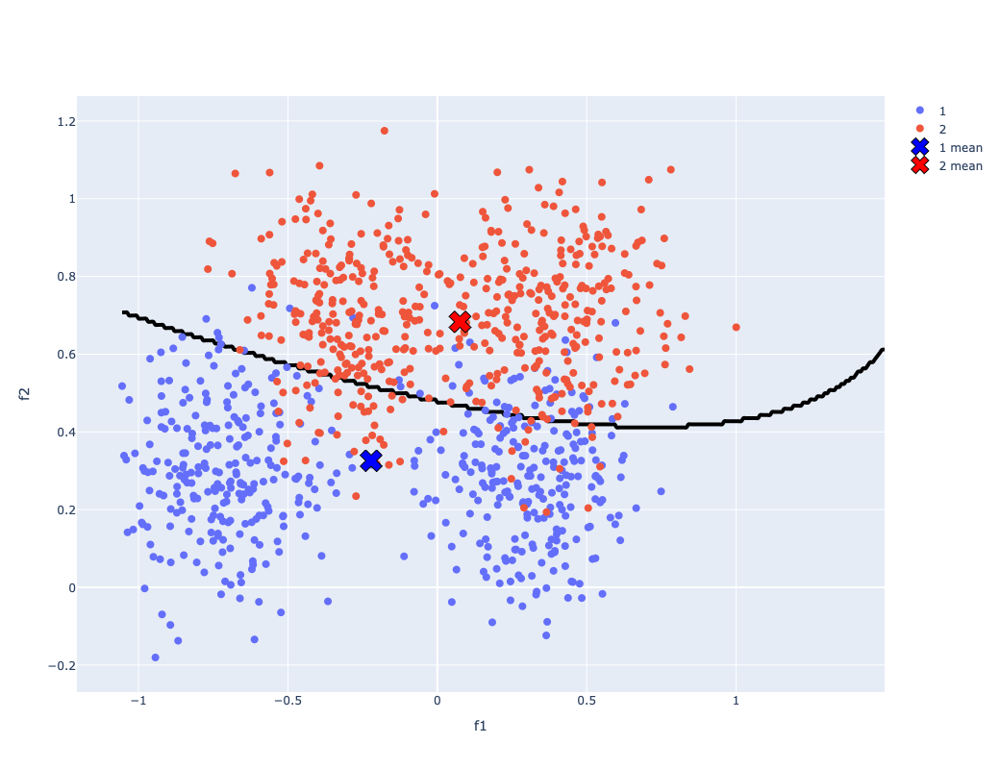

In [27]:
plotDecision(Xte,yte,model,classContours=True,granularity=0.008)